### Graph comparing all cases branches 

In [1]:
import os
import sys
import gc
import math as m
import numpy as np
import scipy
import pandas as pd
import pylab
from scipy.signal import butter, filtfilt, hilbert, find_peaks
from scipy import stats, interpolate
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import Normalize, LinearSegmentedColormap
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.tri as mtri
import warnings
import matplotlib.cm as cm
import matplotlib.colors as mcolors
warnings.filterwarnings("ignore", category=RuntimeWarning)

sys.path.append('/projects/DEIKE/cmartinb/jupyter_notebook/project_specific/turbulence')
sys.path.append('/projects/DEIKE/cmartinb/functions')

from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import *

os.chdir('/projects/DEIKE/cmartinb/')


In [2]:
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (15, 6),
         'axes.labelsize': 30,
         'axes.titlesize':30,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral', 
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, # Enable LaTeX rendering
}

plt.rcParams.update(params)
pylab.rcParams.update(params)


In [3]:
from scipy.special import erf

def calcular_integral1(k, t, u0_t, h):
    nu = nu_water 

    A = np.round(3 / (32 * nu * t), decimals=8)
    B = 2 * k
    D = B / (2 * A)
    C = np.round(B**2 / (4 * A), decimals=8)

    sqrt_A = np.sqrt(A)

    h_plus_D = h + D

    arg1 = sqrt_A * h_plus_D
    arg2 = sqrt_A * D

    I3_factor = 0.5 * np.sqrt(np.pi / A)
    erf_arg1 = erf(arg1)
    erf_arg2 = erf(arg2)
    I3 = (I3_factor * (erf_arg1 - erf_arg2)) 
    
    #print('I3', I3)
    

    log_exp_C =C
    exp_C = np.exp(C) #* 0.985  # Suavización 

    log_exp_neg_AD2 = -A * D**2
    exp_neg_AD2 = np.exp(-A * D**2)

    log_exp_neg_A_h_plus_D_squared = -A * h_plus_D**2
    exp_neg_A_h_plus_D_squared = np.exp(log_exp_neg_A_h_plus_D_squared)

    term1_coef = (1/ (2 * A)) + (D**2 - 16 * nu * t)
    term2_coef = ((3 * D) / (2 * A)) #* 0.995  
    term3_coef = (h / (2 * A)) #* 0.996   


    term1 = term1_coef * I3
    term2 = term2_coef * (exp_neg_AD2 - exp_neg_A_h_plus_D_squared)
    term3 = term3_coef * exp_neg_A_h_plus_D_squared


    integral = (-u0_t / (16 * nu * t)) * exp_C * (term1 + term2 - term3)

    '''
    # Opcional: Imprimir valores intermedios para depuración
    print("Valores intermedios:")
    print(f"A = {A}")
    print(f"B = {B}")
    print(f"D = {D}")
    print(f"C = {C}")
    print(f"sqrt_A = {sqrt_A}")
    print(f"h_plus_D = {h_plus_D}")
    print(f"arg1 = {arg1}")
    print(f"arg2 = {arg2}")
    print(f"I3_factor = {I3_factor}")
    print(f"erf_arg1 = {erf_arg1}")
    print(f"erf_arg2 = {erf_arg2}")
    print(f"I3 = {I3}")
    print(f"log_exp_C = {log_exp_C}")
    print(f"exp_C = {exp_C}")
    print(f"log_exp_neg_AD2 = {log_exp_neg_AD2}")
    print(f"exp_neg_AD2 = {exp_neg_AD2}")
    print(f"log_exp_neg_A_h_plus_D_squared = {log_exp_neg_A_h_plus_D_squared}")
    print(f"exp_neg_A_h_plus_D_squared = {exp_neg_A_h_plus_D_squared}")
    print(f"term1_coef = {term1_coef}")
    print(f"term2_coef = {term2_coef}")
    print(f"term3_coef = {term3_coef}")
    print(f"term1 = {term1}")
    print(f"term2 = {term2}")
    print(f"term3 = {term3}")
    print(f"integral = {integral}")
    '''
    return integral

In [4]:
# Define constants for different cases for the intial conditions

kpHs_list = ['0p08','0p16']
uoc_list = ['0p25', '0p50']  # ,'0p75'

reW = '2.5e4'  # 1.0e5
reA = 720
maxLevel = 10
Bo = 200

rho =1

# Define Reynolds number for water based on reW
if reW == '1.0e5':
    Re_water = 1 * 10**5
else:
    Re_water = 2.5 * 10**4

# Common parameters
kp = 4
u = 0.5
lambdap = 2 * np.pi / kp

L0 = 2 * np.pi
#sigma = (g - 1.25 * 10**(-3)) / (200*4**2)

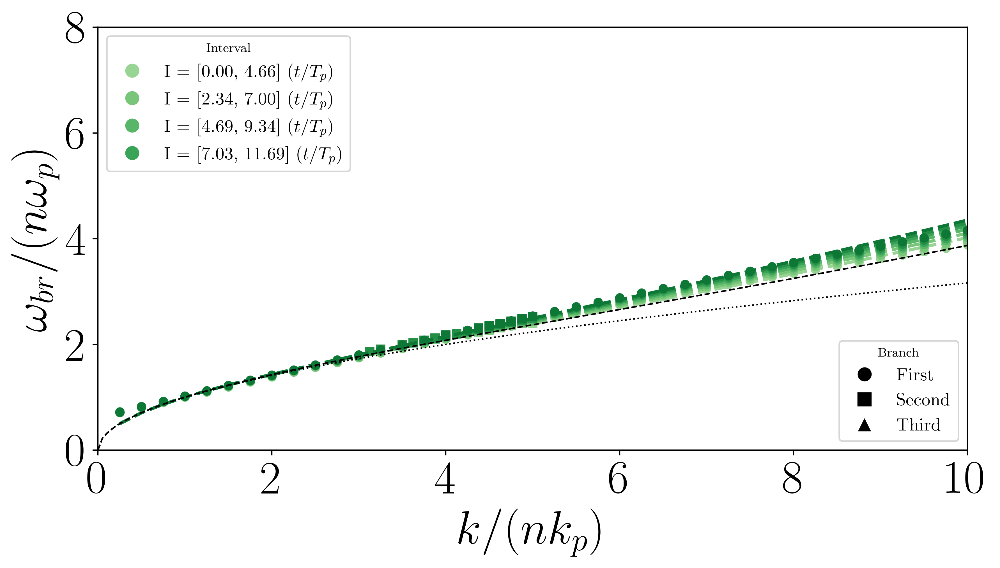

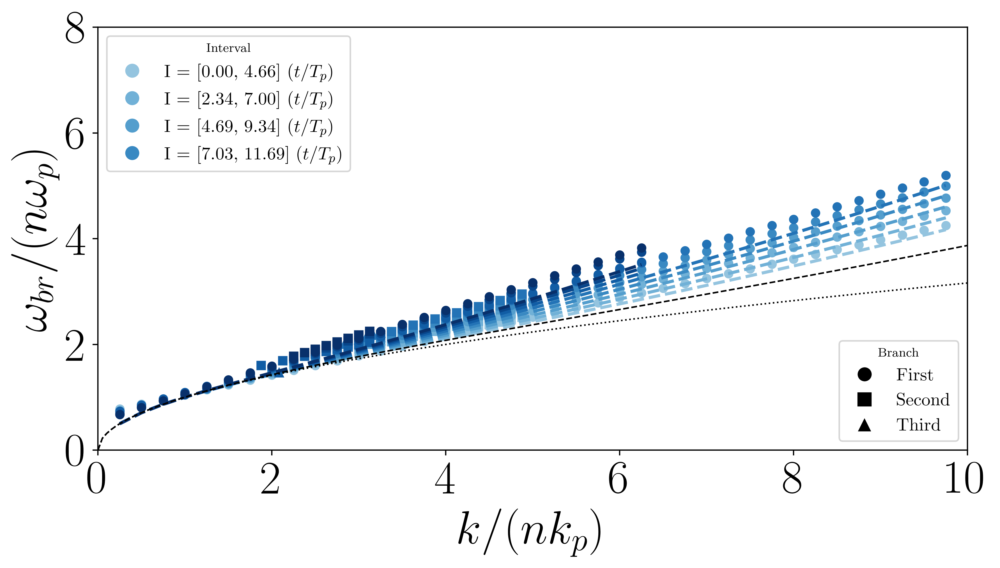

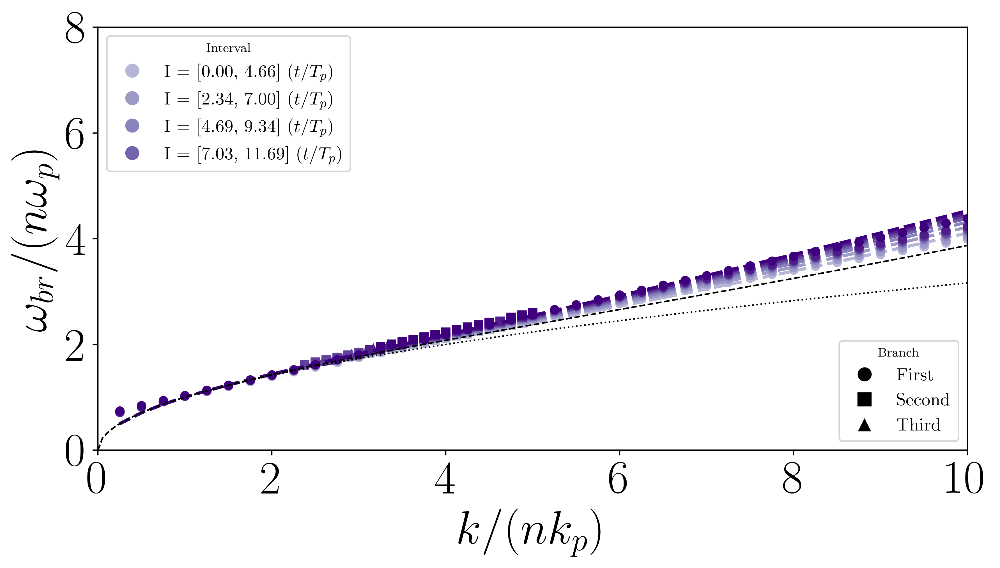

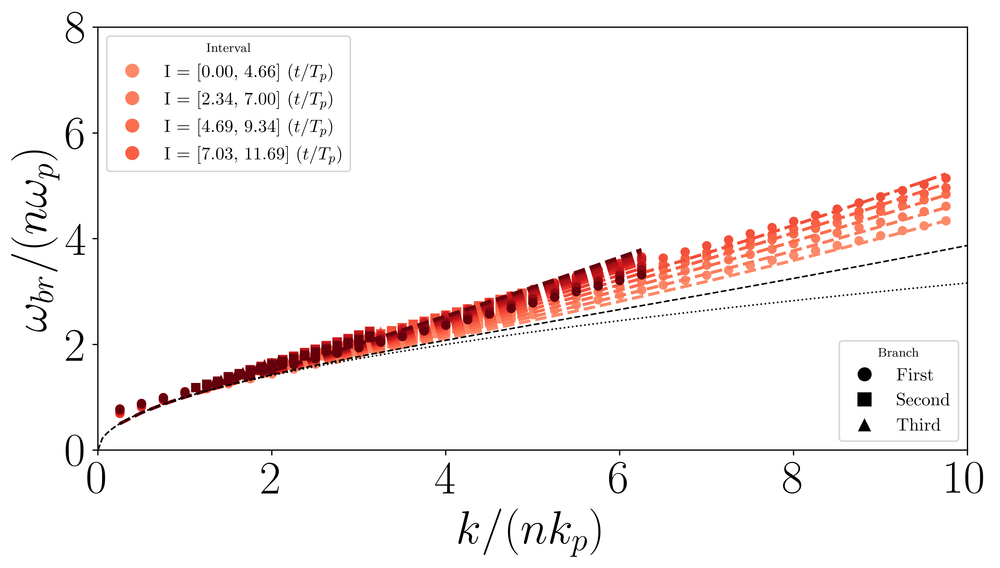

In [5]:
kpHs_list = ['0p08', '0p16']
uoc_list = ['0p25', '0p50']

symbols = ['o', 's', '^']
labels = ['First', 'Second', 'Third']

cmap_08_25 = LinearSegmentedColormap.from_list("greens_darker", cm.Greens(np.linspace(0.4, 1, 100)))
cmap_16_25 = LinearSegmentedColormap.from_list("purples_darker", cm.Purples(np.linspace(0.4, 1, 100)))
cmap_08_50 = LinearSegmentedColormap.from_list("blues_darker", cm.Blues(np.linspace(0.4, 1, 100)))
cmap_16_50 = LinearSegmentedColormap.from_list("reds_darker", cm.Reds(np.linspace(0.4, 1, 100)))


# Define a set of colormaps for different cases
colormaps = {
    ('0p08', '0p25'): cmap_08_25,
    ('0p08', '0p50'): cmap_08_50,
    ('0p16', '0p25'): cmap_16_25,
    ('0p16', '0p50'): cmap_16_50,
}

# Define other parameters
overlap_fraction = 0.5  # Fraction of ln that should overlap
ln = 150
overlap = int(overlap_fraction * ln)  # Calculate overlap as integer

#print('other overlap', int(overlap_fraction * ln))

csv_dir = '/projects/DEIKE/cmartinb/branches_data/'
# Loop over all combinations of kpHs and uoc
for kpHs in kpHs_list:
    for uoc in uoc_list:
        # Generate the CSV file path
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        
        #print(f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        data = np.loadtxt(work_dir+'eta/global_int.out')

        # Calculate parameters for each combination
        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        
        istep_c =data[:, 1]
        time = data[:,0] 
        tstart = time[0]
        indice = np.argmax(omegap*(time - tstart) > 5)
        time = time[indice:]
        
        # Generate the CSV file path
        #print(kpHs,uoc, omegap, c,g)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)
        
        # Extract the necessary columns from the DataFrame
        k_values_first = df_branches['k_values_first'].dropna().to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].dropna().to_numpy()
        k_values_second = df_branches['k_values_second'].dropna().to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].dropna().to_numpy()
        k_values_third = df_branches['k_values_third'].dropna().to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].dropna().to_numpy()
        normalized_omega_first = df_branches['omega_first'].dropna().to_numpy()
        normalized_omega_second = df_branches['omega_second'].dropna().to_numpy()
        normalized_omega_third = df_branches['omega_third'].dropna().to_numpy()
        
        # Choose colormap for this combination
        colormap = colormaps[(kpHs, uoc)]
        
        fig, ax = plt.subplots(figsize=(10, 5))
        start_idx = 0
        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)
        
        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        u_atzero = df_meanvelocity['u_atzero']  
        
        interval_colors = colormap(np.linspace(0, 1, len(u_atzero)))
        
        interval_ranges = []
        for i in range(len(u_atzero)):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0
        
        #print(u_atzero)
        
        for i in range(len(u_atzero)):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            # Plot first branch
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                #print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'sigma is', sigma)                
                #print(f'{time[int(end_idx)] - time[0]}', (time[int(end_idx)] - time[0])/(2*m.pi/omegap), 't/Tp')
                zkp =  2*np.pi /3/ (k_first*4)
                uszt1k =(u_atzero[i]) * np.exp(- zkp/ (np.sqrt(nu_water*2*((time[int(end_idx)] - time[0])))))
                #print(u_atzero[i])
                ax.plot(k_first, normalized_omega_first[idx_first], symbols[0], markersize=5, color=interval_colors[i], label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                ax.plot(k_first ,(np.sqrt(g * k_first*4 + sigma * (k_first*4)**3) + uszt1k * k_first*4)/omegap, '--', linewidth=2, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
                
            # Plot second branch
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                ax.plot(k_second/2, normalized_omega_second[idx_second]/2, symbols[1], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
            
            # Plot third branch
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                ax.plot(k_third/3, normalized_omega_third[idx_third]/3, symbols[2], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
            
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        # Plot theoretical dispersion relations
        k_diss = np.linspace(0, 40, 200)
        dispersion_relation = np.sqrt(k_diss * g)
        
        dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
        ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=1, c='black', label=r"$\omega= \sqrt{gk}$")
        ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=1, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")
        
        ax.set_ylim([0,8])
        ax.set_xlim([0,10])
        
        ax.set_xlabel(r'$k/(nk_{p})$')
        ax.set_ylabel(r'$ \omega_{br} /(n\omega_{p})$')
        
        first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
        ax.add_artist(first_legend)
        
        unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(4)]
        ax.legend(unique_handles, interval_ranges, loc='upper left', title='Interval')

        plt.show()



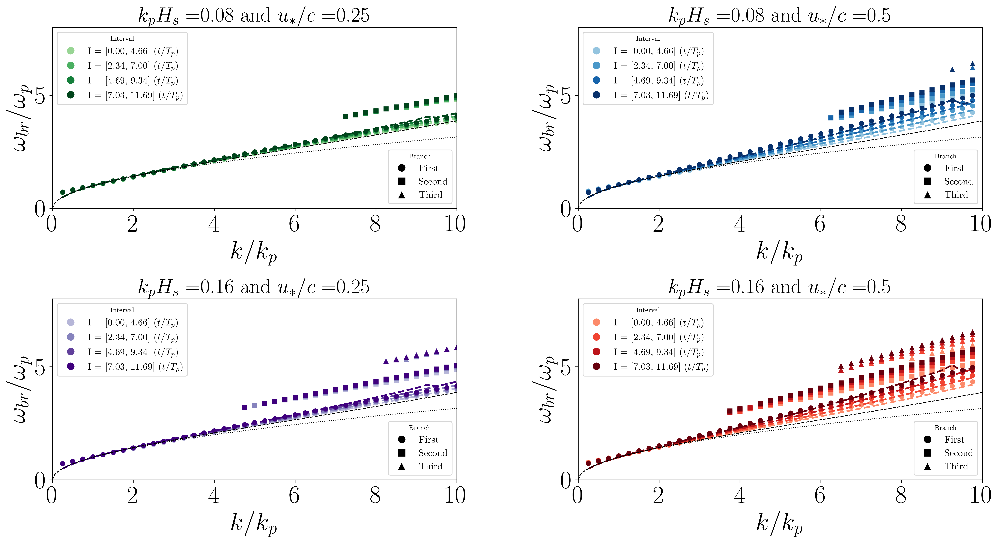

In [6]:
# Define your parameter lists
kpHs_list = ['0p08', '0p16']
uoc_list = ['0p25', '0p50']


# Define other parameters
symbols = ['o', 's', '^']
labels = ['First', 'Second', 'Third']

# Define other parameters
overlap_fraction = 0.5  # Fraction of ln that should overlap
ln = 150
overlap = int(overlap_fraction * ln)  # Calculate overlap as integer

#print('other overlap', int(overlap_fraction * ln))

# Generate subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes = axes.flatten()

plt.subplots_adjust(hspace=0.5, wspace=0.3)
axes = axes.flatten()

# Counter for subplots
subplot_idx = 0

csv_dir = '/projects/DEIKE/cmartinb/branches_data/'
# Loop over all combinations of kpHs and uoc
for kpHs in kpHs_list:
    for uoc in uoc_list:
        # Generate the CSV file path
        ax = axes[subplot_idx]
        subplot_idx += 1
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        
        #print(f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        data = np.loadtxt(work_dir+'eta/global_int.out')

        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        
        istep_c =data[:, 1]
        time = data[:,0] 
        tstart = time[0]
        indice = np.argmax(omegap*(time - tstart) > 5)
        time = time[indice:]
        
        
        # Generate the CSV file path
        #print(kpHs,uoc, omegap, c,g)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)
        
        # Extract the necessary columns from the DataFrame
        k_values_first = df_branches['k_values_first'].dropna().to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].dropna().to_numpy()
        k_values_second = df_branches['k_values_second'].dropna().to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].dropna().to_numpy()
        k_values_third = df_branches['k_values_third'].dropna().to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].dropna().to_numpy()
        normalized_omega_first = df_branches['omega_first'].dropna().to_numpy()
        normalized_omega_second = df_branches['omega_second'].dropna().to_numpy()
        normalized_omega_third = df_branches['omega_third'].dropna().to_numpy()
        
        # Choose colormap for this combination
        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, 4))
        
        start_idx = 0
        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)

        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        #time_moyens =  df_meanvelocity['time_moyens']
        u_atzero = df_meanvelocity['u_atzero']  

        interval_ranges = []
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0

        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            # Plot first branch
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                h = 2*np.pi /(m.pi*7)/ (k_first*4)
                uszt1k = calcular_integral1( 4*k_first, (time[end_idx] - time[0]) , u_atzero[i], h)

                ax.plot(k_first, normalized_omega_first[idx_first], symbols[0], markersize=5, color=interval_colors[i], label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                ax.plot(k_first ,(np.sqrt(g * k_first*4 + sigma * (k_first*4)**3) - uszt1k * k_first*4)/omegap, '--', linewidth=2, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
                
            # Plot second branch
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                ax.plot(k_second, normalized_omega_second[idx_second], symbols[1], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
            
            # Plot third branch
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                ax.plot(k_third, normalized_omega_third[idx_third], symbols[2], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
            
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        # Plot theoretical dispersion relations
        k_diss = np.linspace(0, 40, 200)
        dispersion_relation = np.sqrt(k_diss * g)
        
        dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
        ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=1, c='black', label=r"$\omega= \sqrt{gk}$")
        ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=1, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")
        
        ax.set_ylim([0,8])
        ax.set_xlim([0,10])
        
        # Labels and legends
        ax.set_xlabel(r'$k/k_{p}$')
        ax.set_ylabel(r'$ \omega_{br} /\omega_{p}$')
        
        first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
        ax.add_artist(first_legend)
        
        unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(4)]
        ax.legend(unique_handles, interval_ranges, loc='upper left', title='Interval')
        ax.set_title(f'$ k_pH_s=${ak} and $u_{{*}}/c=${uoc_val}', fontsize = 25)
        # Show the plot
        #plt.show()
        
        #print(f'Plot generated for kpHs={kpHs} and uoc={uoc}')


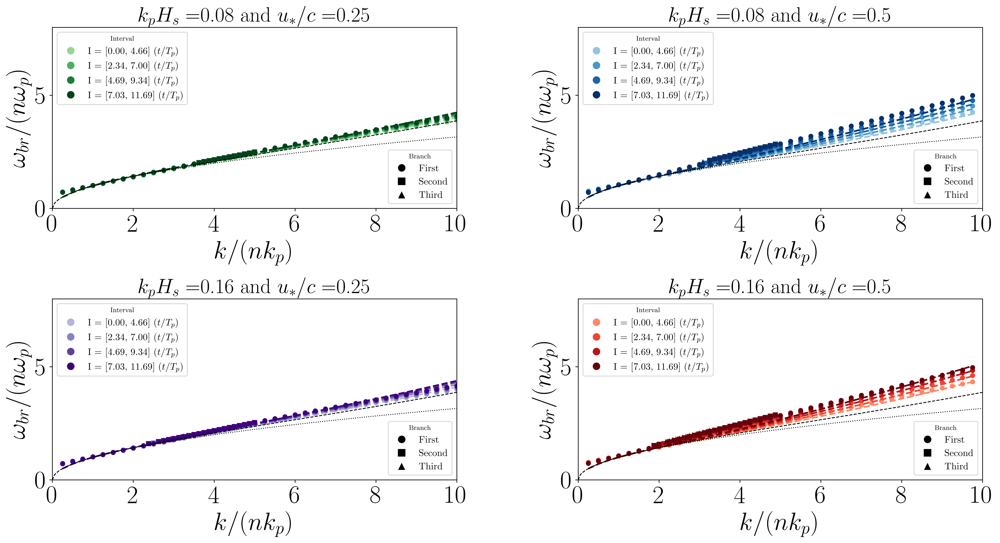

In [7]:
# Define your parameter lists
kpHs_list = ['0p08', '0p16']
uoc_list = ['0p25', '0p50']


# Define other parameters
symbols = ['o', 's', '^']
labels = ['First', 'Second', 'Third']

# Define other parameters
overlap_fraction = 0.5  # Fraction of ln that should overlap
ln = 150
overlap = int(overlap_fraction * ln)  # Calculate overlap as integer

#print('other overlap', int(overlap_fraction * ln))

# Generate subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes = axes.flatten()

plt.subplots_adjust(hspace=0.5, wspace=0.3)
axes = axes.flatten()

# Counter for subplots
subplot_idx = 0

csv_dir = '/projects/DEIKE/cmartinb/branches_data/'
# Loop over all combinations of kpHs and uoc
for kpHs in kpHs_list:
    for uoc in uoc_list:
        # Generate the CSV file path
        ax = axes[subplot_idx]
        subplot_idx += 1
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        
        #print(f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        data = np.loadtxt(work_dir+'eta/global_int.out')

        # Calculate parameters for each combination
        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        
        istep_c =data[:, 1]
        time = data[:,0] 
        tstart = time[0]
        indice = np.argmax(omegap*(time - tstart) > 5)
        time = time[indice:]
        
        
        # Generate the CSV file path
        #print(kpHs,uoc, omegap, c,g)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)
        
        # Extract the necessary columns from the DataFrame
        k_values_first = df_branches['k_values_first'].dropna().to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].dropna().to_numpy()
        k_values_second = df_branches['k_values_second'].dropna().to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].dropna().to_numpy()
        k_values_third = df_branches['k_values_third'].dropna().to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].dropna().to_numpy()
        normalized_omega_first = df_branches['omega_first'].dropna().to_numpy()
        normalized_omega_second = df_branches['omega_second'].dropna().to_numpy()
        normalized_omega_third = df_branches['omega_third'].dropna().to_numpy()
        
        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, 4))
        
        start_idx = 0
        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)

        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        #time_moyens =  df_meanvelocity['time_moyens']
        u_atzero = df_meanvelocity['u_atzero']  
        
        
        # Initialize interval ranges
        interval_ranges = []
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0
        
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                zkp =  2*np.pi /3/ (k_first*4)
                uszt1k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.plot(k_first, normalized_omega_first[idx_first], symbols[0], markersize=5, color=interval_colors[i], label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                ax.plot(k_first ,(np.sqrt(g * k_first*4 + sigma * (k_first*4)**3) + uszt1k * k_first*4)/omegap, '--', linewidth=2, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
                
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                ax.plot(k_second/2, normalized_omega_second[idx_second]/2, symbols[1], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
            
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                ax.plot(k_third/3, normalized_omega_third[idx_third]/3, symbols[2], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
            
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        # Plot theoretical dispersion relations
        k_diss = np.linspace(0, 40, 200)
        dispersion_relation = np.sqrt(k_diss * g)
        
        dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
        ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=1, c='black', label=r"$\omega= \sqrt{gk}$")
        ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=1, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")
        
        ax.set_ylim([0,8])
        ax.set_xlim([0,10])
        
        ax.set_xlabel(r'$k/(nk_{p})$')
        ax.set_ylabel(r'$ \omega_{br} /(n\omega_{p})$')
        
        first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
        ax.add_artist(first_legend)
        
        unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(4)]
        ax.legend(unique_handles, interval_ranges, loc='upper left', title='Interval')
        ax.set_title(f'$ k_pH_s=${ak} and $u_{{*}}/c=${uoc_val}', fontsize = 25)



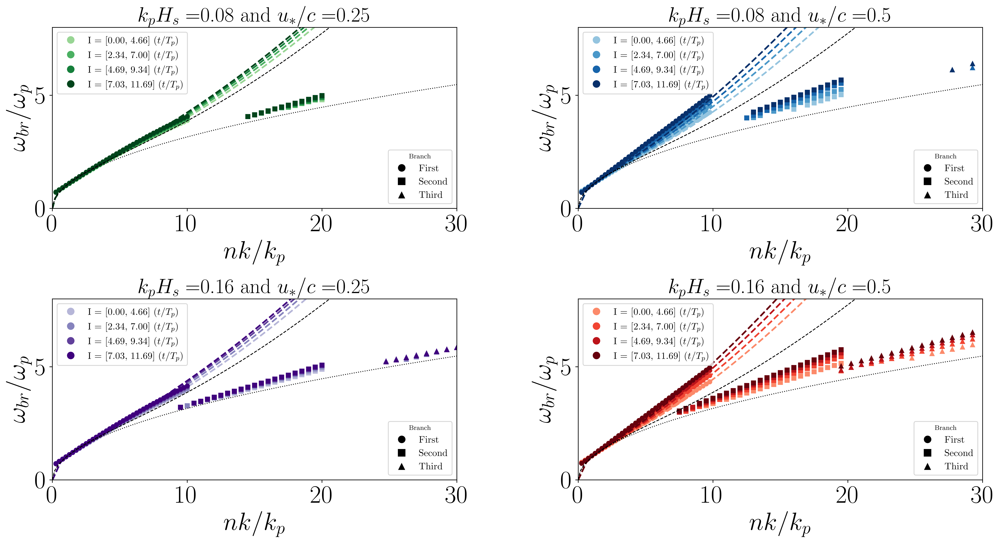

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes = axes.flatten()

plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Counter for subplots
subplot_idx = 0

csv_dir = '/projects/DEIKE/cmartinb/branches_data/'
# Loop over all combinations of kpHs and uoc
for kpHs in kpHs_list:
    for uoc in uoc_list:
        # Generate the CSV file path
        ax = axes[subplot_idx]
        subplot_idx += 1
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        
        #print(f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        data = np.loadtxt(work_dir+'eta/global_int.out')

        # Calculate parameters for each combination
        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        
        istep_c =data[:, 1]
        time = data[:,0] 
        tstart = time[0]
        indice = np.argmax(omegap*(time - tstart) > 5)
        time = time[indice:]
        
        
        # Generate the CSV file path
        #print(kpHs,uoc, omegap, c,g)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)
        
        # Extract the necessary columns from the DataFrame
        k_values_first = df_branches['k_values_first'].dropna().to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].dropna().to_numpy()
        k_values_second = df_branches['k_values_second'].dropna().to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].dropna().to_numpy()
        k_values_third = df_branches['k_values_third'].dropna().to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].dropna().to_numpy()
        normalized_omega_first = df_branches['omega_first'].dropna().to_numpy()
        normalized_omega_second = df_branches['omega_second'].dropna().to_numpy()
        normalized_omega_third = df_branches['omega_third'].dropna().to_numpy()
        
        # Choose colormap for this combination
        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, 4))
        
        start_idx = 0
        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)
        
        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        u_atzero = df_meanvelocity['u_atzero']  
        

        interval_ranges = []
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0

        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            # Plot first branch
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                #print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'sigma is', sigma)                
                #print(f'{time[int(end_idx)] - time[0]}', (time[int(end_idx)] - time[0])/(2*m.pi/omegap), 't/Tp')
                zkp =  2*np.pi /3/ (k_first*4)
                uszt1k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                
                zk_diss =  2*np.pi /3/ (k_diss*4)
                uszt1_diss =(u_atzero[i]) *np.exp(- zk_diss/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                #print(u_atzero[i])
                ax.plot(k_first, normalized_omega_first[idx_first], symbols[0], markersize=5, color=interval_colors[i], label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                ax.plot(k_diss ,(np.sqrt(g * k_diss*4 + sigma * (k_diss*4)**3) + uszt1_diss * k_diss*4)/omegap, '--', linewidth=2, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
                
            # Plot second branch
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                ax.plot(2*k_second, normalized_omega_second[idx_second], symbols[1], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
                
                zkp_diss =  2*np.pi /3/ (k_diss*4)
                uszt2_diss =(u_atzero[i]) *np.exp(- zkp_diss/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                
                #ax.plot(k_diss/2 , 2*(np.sqrt(g * k_diss*4 + sigma * (k_diss*4)**3) + uszt2_diss * k_diss*4)/omegap + 0.5, '--', linewidth=2, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
                
            # Plot third branch
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                ax.plot(3*k_third, normalized_omega_third[idx_third], symbols[2], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
                
                
                #ax.plot(k_diss ,(np.sqrt(g * k_diss*4 + sigma * (k_diss*4)**3) + uszt1_diss * 2*k_diss*4)/omegap, '--', linewidth=2, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "")
                
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        # Plot theoretical dispersion relations
        k_diss = np.linspace(0, 120, 200)
        dispersion_relation = np.sqrt(k_diss * g)
        
        dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
        ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=1, c='black', label=r"$\omega= \sqrt{gk}$")
        ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=1, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")
        
        ax.set_ylim([0,8])
        ax.set_xlim([0,30])
        
        # Labels and legends
        ax.set_xlabel(r'$nk/k_{p}$')
        ax.set_ylabel(r'$ \omega_{br} /\omega_{p}$')
        
        first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
        ax.add_artist(first_legend)
        
        unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(4)]
        ax.legend(unique_handles, interval_ranges, loc='upper left')
        ax.set_title(f'$ k_pH_s=${ak} and $u_{{*}}/c=${uoc_val}', fontsize = 25)
        # Show the plot
        #plt.show()
        plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/all_branches_withu.png', dpi=300, bbox_inches='tight')
        
        
        #print(f'Plot generated for kpHs={kpHs} and uoc={uoc}')


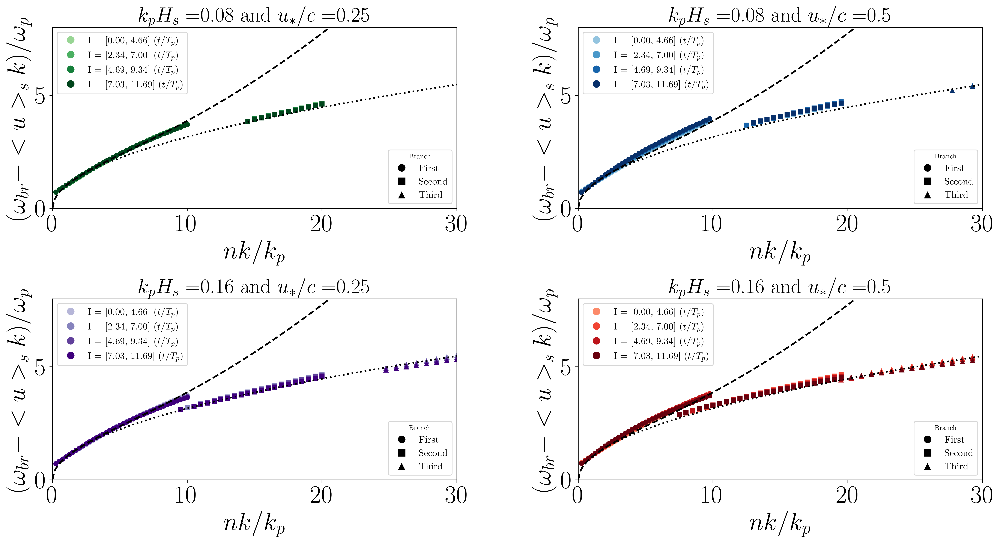

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes = axes.flatten()

plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Counter for subplots
subplot_idx = 0

csv_dir = '/projects/DEIKE/cmartinb/branches_data/'
# Loop over all combinations of kpHs and uoc
for kpHs in kpHs_list:
    for uoc in uoc_list:
        # Generate the CSV file path
        ax = axes[subplot_idx]
        subplot_idx += 1
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        
        #print(f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        data = np.loadtxt(work_dir+'eta/global_int.out')

        # Calculate parameters for each combination
        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        
        istep_c =data[:, 1]
        time = data[:,0] 
        tstart = time[0]
        indice = np.argmax(omegap*(time - tstart) > 5)
        time = time[indice:]
        
        
        # Generate the CSV file path
        #print(kpHs,uoc, omegap, c,g)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)
        
        # Extract the necessary columns from the DataFrame
        k_values_first = df_branches['k_values_first'].dropna().to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].dropna().to_numpy()
        k_values_second = df_branches['k_values_second'].dropna().to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].dropna().to_numpy()
        k_values_third = df_branches['k_values_third'].dropna().to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].dropna().to_numpy()
        normalized_omega_first = df_branches['omega_first'].dropna().to_numpy()
        normalized_omega_second = df_branches['omega_second'].dropna().to_numpy()
        normalized_omega_third = df_branches['omega_third'].dropna().to_numpy()
        
        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, 4))
        
        start_idx = 0
        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)
        
        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        #time_moyens =  df_meanvelocity['time_moyens']
        u_atzero = df_meanvelocity['u_atzero']  
        
        
        # Initialize interval ranges
        interval_ranges = []
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0
        
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            # Plot first branch
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                zkp =  2*np.pi /3/ (k_first*4)
                uszt1k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.plot(k_first, normalized_omega_first[idx_first]- uszt1k * k_first * 4 / omegap, symbols[0], markersize=5, color=interval_colors[i], label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                zkp =  2*np.pi /3/ (k_second*4)
                uszt2k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.plot(2*k_second, normalized_omega_second[idx_second]- uszt2k * k_second * 4 / omegap, symbols[1], markersize=5, color=interval_colors[i], label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
    
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                zkp =  2*np.pi /3/ (k_third*4)
                uszt3k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.plot(3*k_third, normalized_omega_third[idx_third]- uszt3k * k_third * 4 / omegap, symbols[2], markersize=5, color=interval_colors[i], label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                

            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        # Plot theoretical dispersion relations
        k_diss = np.linspace(0, 120, 200)
        dispersion_relation = np.sqrt(k_diss * g)
        
        dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
        ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=2, c='black', label=r"$\omega= \sqrt{gk}$")
        ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=2, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")
        
        ax.set_ylim([0,8])
        ax.set_xlim([0,30])
        
        # Labels and legends
        ax.set_xlabel(r'$nk/k_{p}$')
        ax.set_ylabel(r'$ (\omega_{br} - <u>_{s} k) /\omega_{p}$')
        
        first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
        ax.add_artist(first_legend)
        
        unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(4)]
        ax.legend(unique_handles, interval_ranges, loc='upper left')
        ax.set_title(f'$ k_pH_s=${ak} and $u_{{*}}/c=${uoc_val}', fontsize = 25)
        plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/all_branches_minusu.png', dpi=300, bbox_inches='tight')


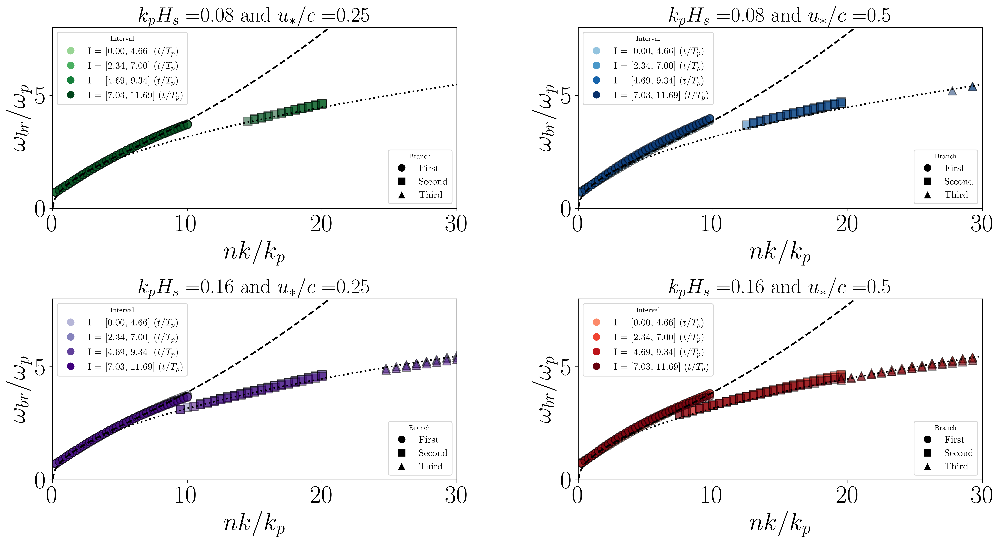

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes = axes.flatten()

plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Counter for subplots
subplot_idx = 0

csv_dir = '/projects/DEIKE/cmartinb/branches_data/'
# Loop over all combinations of kpHs and uoc
for kpHs in kpHs_list:
    for uoc in uoc_list:
        # Generate the CSV file path
        ax = axes[subplot_idx]
        subplot_idx += 1
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        
        #print(f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        data = np.loadtxt(work_dir+'eta/global_int.out')

        # Calculate parameters for each combination
        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        
        istep_c =data[:, 1]
        time = data[:,0] 
        tstart = time[0]
        indice = np.argmax(omegap*(time - tstart) > 5)
        time = time[indice:]
        
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)
        
        # Extract the necessary columns from the DataFrame
        k_values_first = df_branches['k_values_first'].dropna().to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].dropna().to_numpy()
        k_values_second = df_branches['k_values_second'].dropna().to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].dropna().to_numpy()
        k_values_third = df_branches['k_values_third'].dropna().to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].dropna().to_numpy()
        normalized_omega_first = df_branches['omega_first'].dropna().to_numpy()
        normalized_omega_second = df_branches['omega_second'].dropna().to_numpy()
        normalized_omega_third = df_branches['omega_third'].dropna().to_numpy()
        
        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, 4))

        start_idx = 0
        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)
        
        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        u_atzero = df_meanvelocity['u_atzero']  
        

        interval_ranges = []
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0

        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            # Plot first branch
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                zkp =  2*np.pi /3/ (k_first*4)
                uszt1k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.scatter(k_first, normalized_omega_first[idx_first] - uszt1k * k_first * 4 / omegap, s=100, alpha =0.5, color=interval_colors[i], edgecolor='black', marker=symbols[0],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
        
            # Plot second branch
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                zkp =  2*np.pi /3/ (k_second*4)
                uszt2k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.scatter(2 * k_second, normalized_omega_second[idx_second] - uszt2k * k_second * 4 / omegap, s=100, alpha =0.5, color=interval_colors[i], edgecolor='black', marker=symbols[1],label=interval_ranges[i] if i == 0 else "")
    
                
            # Plot third branch
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                zkp =  2*np.pi /3/ (k_third*4)
                uszt3k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.scatter(3 * k_third, normalized_omega_third[idx_third] - uszt3k * k_third * 4 / omegap, s=100, alpha =0.5, color=interval_colors[i], edgecolor='black', marker=symbols[2],label=interval_ranges[i] if i == 0 else "")
    

            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        # Plot theoretical dispersion relations
        k_diss = np.linspace(0, 120, 200)
        dispersion_relation = np.sqrt(k_diss * g)
        
        dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
        ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=2, c='black', label=r"$\omega= \sqrt{gk}$")
        ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=2, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")
        
        ax.set_ylim([0,8])
        ax.set_xlim([0,30])
        
        # Labels and legends
        ax.set_xlabel(r'$nk/k_{p}$')
        ax.set_ylabel(r'$ \omega_{br} /\omega_{p}$')
        
        first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
        ax.add_artist(first_legend)
        
        unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(4)]
        ax.legend(unique_handles, interval_ranges, loc='upper left', title='Interval')
        ax.set_title(f'$ k_pH_s=${ak} and $u_{{*}}/c=${uoc_val}', fontsize = 25)
        # Show the plot
        #plt.show()
        
        #print(f'Plot generated for kpHs={kpHs} and uoc={uoc}')


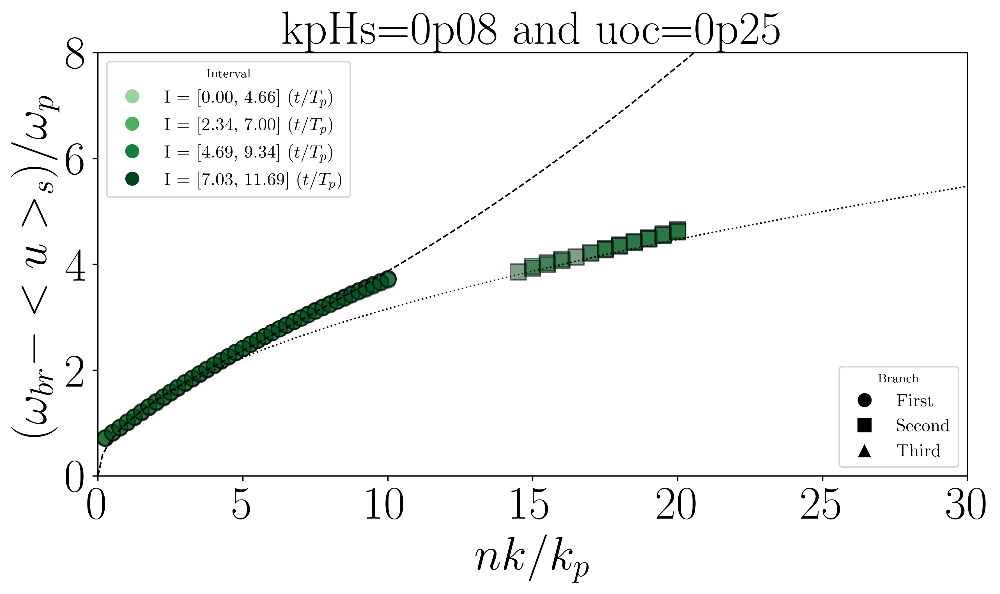

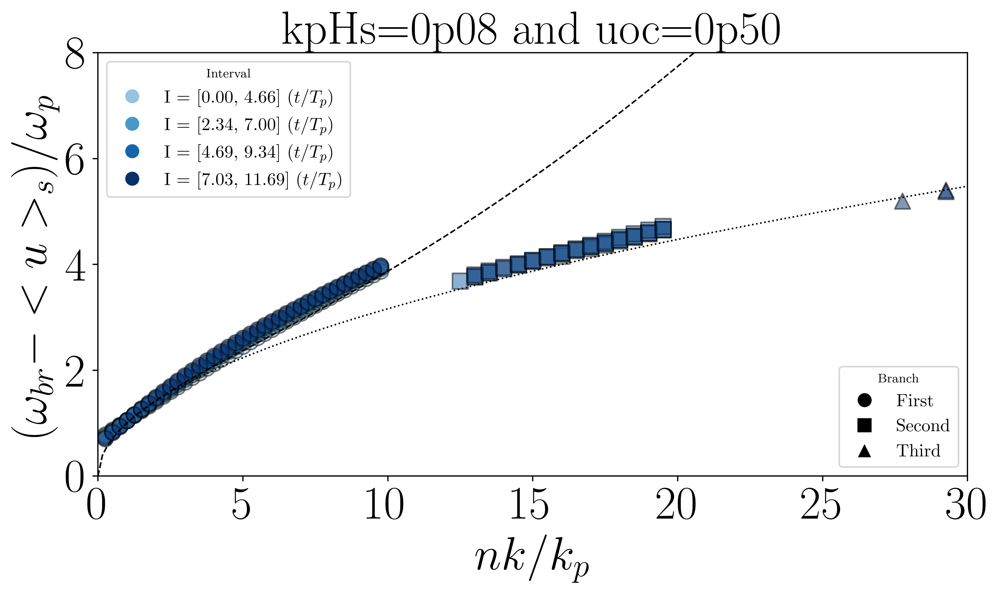

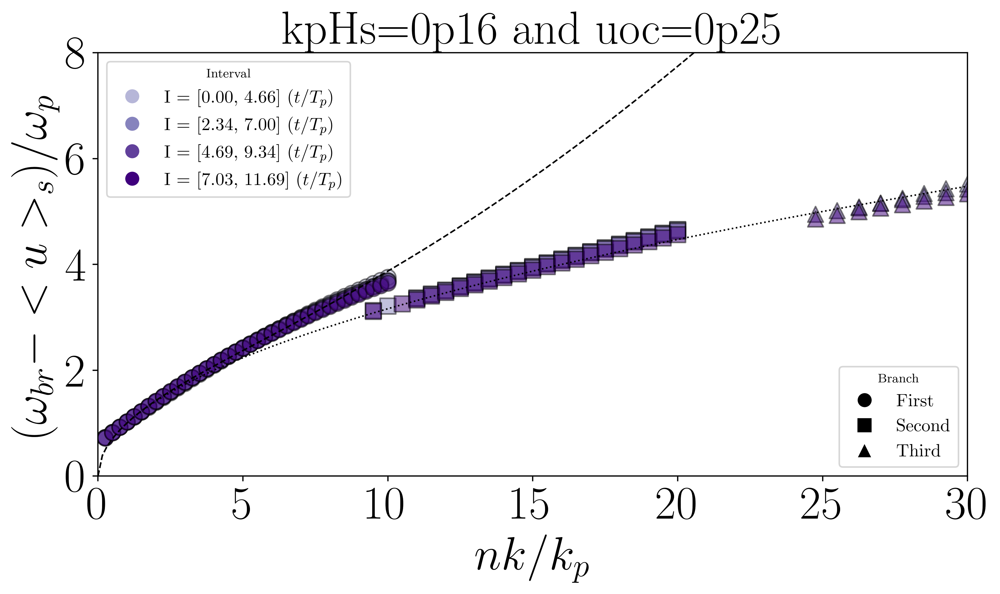

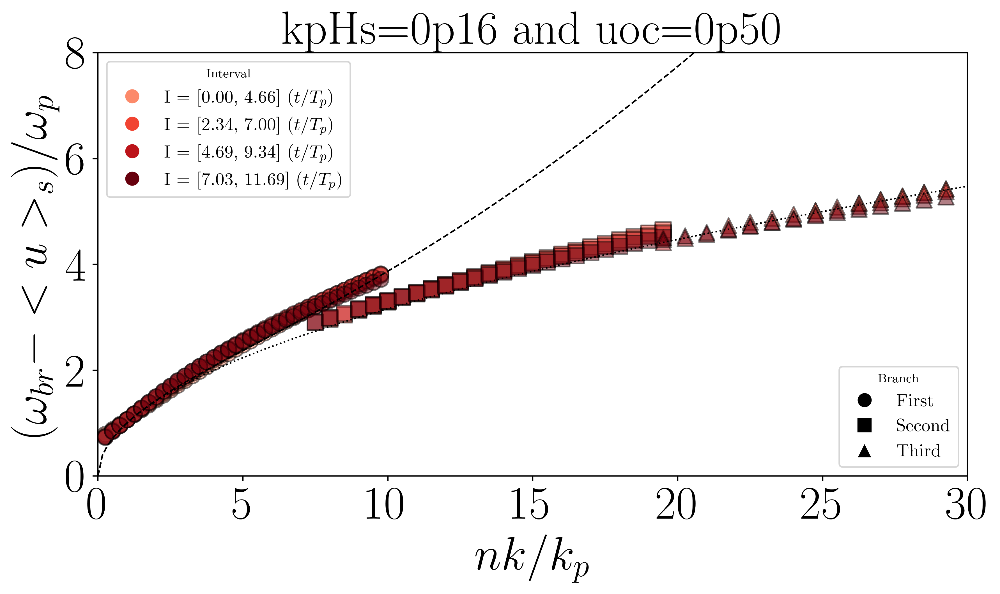

In [11]:
csv_dir = '/projects/DEIKE/cmartinb/branches_data/'
# Loop over all combinations of kpHs and uoc
for kpHs in kpHs_list:
    for uoc in uoc_list:
        # Generate the CSV file path
        #ax = axes[subplot_idx]
        fig, ax = plt.subplots(figsize=(10, 5))
        #subplot_idx += 1
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        
        #print(f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        data = np.loadtxt(work_dir+'eta/global_int.out')

        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        
        istep_c =data[:, 1]
        time = data[:,0] 
        tstart = time[0]
        indice = np.argmax(omegap*(time - tstart) > 5)
        time = time[indice:]
        
        
        # Generate the CSV file path
        #print(kpHs,uoc, omegap, c,g)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        df_branches = pd.read_csv(csv_file)
        
        k_values_first = df_branches['k_values_first'].dropna().to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].dropna().to_numpy()
        k_values_second = df_branches['k_values_second'].dropna().to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].dropna().to_numpy()
        k_values_third = df_branches['k_values_third'].dropna().to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].dropna().to_numpy()
        normalized_omega_first = df_branches['omega_first'].dropna().to_numpy()
        normalized_omega_second = df_branches['omega_second'].dropna().to_numpy()
        normalized_omega_third = df_branches['omega_third'].dropna().to_numpy()

        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, 4))
        
        # Your plot setup
        #fig, ax = plt.subplots(figsize=(10, 5))
        start_idx = 0
        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)
        
        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        #time_moyens =  df_meanvelocity['time_moyens']
        u_atzero = df_meanvelocity['u_atzero']  
        

        interval_ranges = []
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0
        
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i

            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                zkp =  2*np.pi /3/ (k_first*4)
                uszt1k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.scatter(k_first, normalized_omega_first[idx_first] - uszt1k * k_first * 4 / omegap, s=100, alpha =0.5, color=interval_colors[i], edgecolor='black', marker=symbols[0],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
        
            # Plot second branch
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                zkp =  2*np.pi /3/ (k_second*4)
                uszt2k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.scatter(2 * k_second, normalized_omega_second[idx_second] - uszt2k * k_second * 4 / omegap, s=100, alpha =0.5, color=interval_colors[i], edgecolor='black', marker=symbols[1],label=interval_ranges[i] if i == 0 else "")
    
                
            # Plot third branch
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                zkp =  2*np.pi /3/ (k_third*4)
                uszt3k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                ax.scatter(3 * k_third, normalized_omega_third[idx_third] - uszt3k * k_third * 4 / omegap, s=100, alpha =0.5, color=interval_colors[i], edgecolor='black', marker=symbols[2],label=interval_ranges[i] if i == 0 else "")
    
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break

        k_diss = np.linspace(0, 120, 200)
        dispersion_relation = np.sqrt(k_diss * g)
        
        dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
        ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=1, c='black', label=r"$\omega= \sqrt{gk}$")
        ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=1, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")
        
        ax.set_ylim([0,8])
        ax.set_xlim([0,30])
        
        # Labels and legends
        ax.set_xlabel(r'$nk/k_{p}$')
        ax.set_ylabel(r'$ (\omega_{br}- <u>_{s}) /\omega_{p}$')
        
        first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
        ax.add_artist(first_legend)
        
        unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(4)]
        ax.legend(unique_handles, interval_ranges, loc='upper left', title='Interval')
        ax.set_title(f' kpHs={kpHs} and uoc={uoc}')


In [12]:
file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

df_meanvelocity = pd.read_csv(file_path)
phi_avg = df_meanvelocity['phi_avg']
ux_avg = df_meanvelocity['ux_avg']
time_moyens =  df_meanvelocity['time_moyens']
u_atzero = df_meanvelocity['u_atzero']  

0p08 0p25
0p08 0p50
0p16 0p25
0p16 0p50


/tmp/ipykernel_907896/3428561790.py:233: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = Colorbar(
/tmp/ipykernel_907896/3428561790.py:233: MatplotlibDeprecationWarning: The 'norm' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = Colorbar(


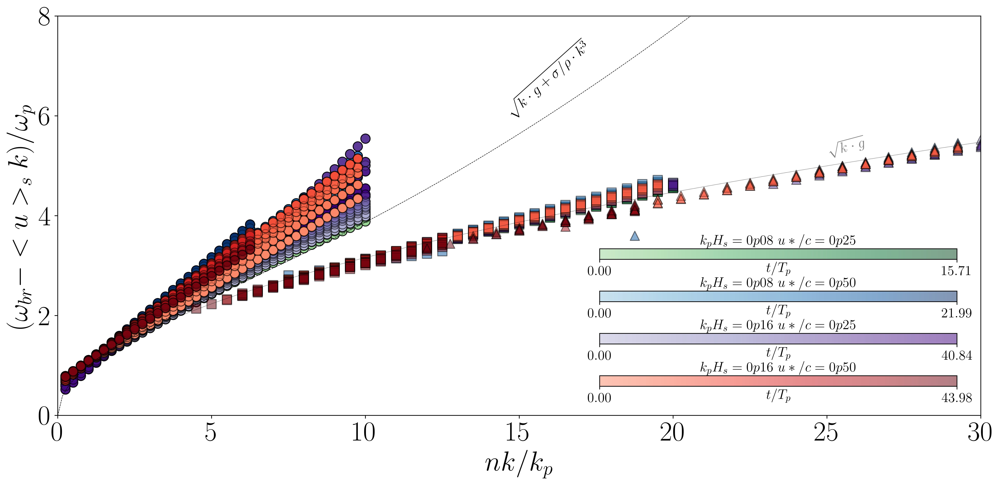

In [13]:
from matplotlib.colorbar import Colorbar
symbols = ['o', 's', '^']
labels = ['First', 'Second', 'Third']

csv_dir = '/projects/DEIKE/cmartinb/branches_data/'

palettes = {
    r'$k_pH_s =0.08$ $u*/c=0.25$': cmap_08_25,
    r'$k_pH_s =0.16$ $u*/c=0.25$': cmap_16_25,
    r'$k_pH_s =0.16$ $u*/c=0.50$': cmap_16_50,
    r'$k_pH_s =0.08$ $u*/c=0.50$': cmap_08_50
}


fig, ax = plt.subplots(figsize=(18, 8))


scatter_plots = {}
norms = {}

for kpHs in kpHs_list:
    for uoc in uoc_list:
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        data = np.loadtxt(work_dir+'eta/global_int.out')

        istep_c =data[:, 1]
        time = data[:,0] 

        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        # Generate the CSV file path
        print(kpHs,uoc)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)

        k_values_first = df_branches['k_values_first'].to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].to_numpy()
        k_values_second = df_branches['k_values_second'].to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].to_numpy()
        k_values_third = df_branches['k_values_third'].to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].to_numpy()
        normalized_omega_first = df_branches['omega_first'].to_numpy()
        normalized_omega_second = df_branches['omega_second'].to_numpy()
        normalized_omega_third = df_branches['omega_third'].to_numpy()
        

        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)


        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        #time_moyens =  df_meanvelocity['time_moyens']
        u_atzero = df_meanvelocity['u_atzero']  
        

        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, len(u_atzero)))
        
        # Initialize interval ranges
        start_idx = 0
        interval_ranges = []
        for i in range(len(u_atzero)):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0
        
        # Plot points with different colors based on the interval
        for i in range(len(u_atzero)):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                #print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'sigma is', sigma)                
                #print(f'{time[int(end_idx)] - time[0]}', (time[int(end_idx)] - time[0])/(2*m.pi/omegap), 't/Tp')
                #zkp =  2*np.pi /3/ (k_first*4)
                #uszt1k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                h = 2*np.pi /(m.pi*7)/ (k_first*4)
                
                # Reemplazar caracteres no numéricos y dividir
                ux_avg_i = np.array([float(x) for x in ux_avg[i].replace("\n", "").replace(" ", "").strip("[]").split(",")])
                phi_avg_i = np.array([float(x) for x in phi_avg[i].replace("\n", "").replace(" ", "").strip("[]").split(",")])
                # Realizar la integración para cada valor de k y almacenar los perfiles para la gráfica derecha
                integral_num = []
                for k in k_first:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
                #uszt1k = calcular_integral1( 4*k_first, (time[end_idx] - time[0]) , u_atzero[i], h)
                #ax.scatter(k_first, normalized_omega_first[idx_first] - 2 * np.array(integral_num) * k_first * 4 / omegap, s=100, alpha = 0.5, color=interval_colors[i], edgecolor='black', marker=symbols[0],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                scatter = ax.scatter(
                    k_values_first,
                    normalized_omega_first,
                    c=interval_indices_first,
                    cmap=colormap,
                    s=100,
                    edgecolor='black',
                    alpha=0.5,
                    label=rf'$k_pH_s ={kpHs}$ $u*/c={uoc}$'
                )
                #ax.fill_between(k_first, (normalized_omega_first[idx_first] - uszt1k * k_first * 4/omegap) ,  alpha=0.2, color=interval_colors[i])
            
                scatter_plots[(kpHs, uoc)] = scatter
                #norms[(kpHs, uoc)] = norm

            # Plot second branch
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                #zkp =  2*np.pi /3/ (k_second*4)
                #uszt2k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                
                h = 2*np.pi /(m.pi*7)/ (k_second*4)
                
                integral_num = []
                for k in k_second:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
                #uszt1k = calcular_integral1( 4*k_first, (time[end_idx] - time[0]) , u_atzero[i], h)
                ax.scatter(2*k_second, normalized_omega_second[idx_second] - 2 * np.array(integral_num) * k_second * 4 / omegap, s=100, alpha = 0.5, color=interval_colors[i], edgecolor='black', marker=symbols[1],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                #ax.fill_between(k_first, (normalized_omega_first[idx_first] - uszt1k * k_first * 4/omegap) ,  alpha=0.2, color=interval_colors[i])
                
                #uszt2k = calcular_integral1( 4*k_second, (time[end_idx] - time[0]) , u_atzero[i], h)
                #ax.scatter(2 * k_second, normalized_omega_second[idx_second] + uszt2k*(4*k_second)/ omegap, s=100,  alpha = 0.5,color=interval_colors[i], edgecolor='black', marker=symbols[1],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
    
                
            # Plot third branch
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                #zkp =  2*np.pi /3/ (k_third*4)
                #uszt3k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                
                h = 2*np.pi /(m.pi*7)/ (k_third*4)
                
                                # Realizar la integración para cada valor de k y almacenar los perfiles para la gráfica derecha
                integral_num = []
                for k in k_third:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
                #uszt1k = calcular_integral1( 4*k_first, (time[end_idx] - time[0]) , u_atzero[i], h)
                ax.scatter(3*k_third, normalized_omega_third[idx_third] - 2 * np.array(integral_num) * k_third * 4 / omegap, s=100, alpha = 0.5, color=interval_colors[i], edgecolor='black', marker=symbols[2],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                #ax.fill_between(k_first, (normalized_omega_first[idx_first] - uszt1k * k_first * 4/omegap) ,  alpha=0.2, color=interval_colors[i])
                
                #uszt3k = calcular_integral1( 4*k_third, (time[end_idx] - time[0]) , u_atzero[i], h)
                #ax.scatter(3 * k_third, normalized_omega_third[idx_third] + uszt3k *(4*k_third) / omegap, s=100,  alpha = 0.5,color=interval_colors[i], edgecolor='black', marker=symbols[2],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
            
            
            
            start_idx += (ln - overlap)
            i+=1
            if start_idx >= len(time):
                break
                
                
                

num_intervals=4

handles_kpoHs016_uoc050 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.16$ $u*/c=0.50$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(15)]
handles_kpoHs016_uoc025 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.16$ $u*/c=0.25$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(4)]
handles_kpoHs008_uoc025 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.08$ $u*/c=0.25$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(4)]
handles_kpoHs008_uoc050 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.08$ $u*/c=0.50$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(15)]


                
ax.text(25,5.2, r'$ \sqrt{k \cdot g} $', c='grey', fontsize = 16, rotation = 15)
ax.text(14.5,6, r'$ \sqrt{k \cdot g + \sigma / \rho \cdot k^3} $', fontsize = 16 ,rotation = 42)               

# Plot theoretical dispersion relations
k_diss = np.linspace(0, 120, 200)
dispersion_relation = np.sqrt(k_diss * g)
sigma = (1 - 1.25 * 10**(-3)) / (200 * 4**2)
dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=0.5, c='black')
ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=0.5, c='black')
ax.set_ylim([0,8])
ax.set_xlim([0,30])
ax.set_xlabel(r'$nk/k_{p}$')
ax.set_ylabel(r'$ (\omega_{br} - <u>_{s}k) /\omega_{p}$')

colorbar_length = 0.3 
colorbar_pad = 0.08  

def saturate_cmap(cmap, saturation=4):
    """Aumenta la saturación de un colormap."""
    colors_array = cmap(np.linspace(0, 1, 256))
    hsv = mcolors.rgb_to_hsv(colors_array[:, :3])
    hsv[:, 1] = np.clip(hsv[:, 1] * saturation, 0, 1) 
    saturated_colors = mcolors.hsv_to_rgb(hsv)
    return mcolors.LinearSegmentedColormap.from_list("saturated_cmap", saturated_colors)

for idx, ((kpHs, uoc), scatter) in enumerate(scatter_plots.items()):
    vmin, vmax = scatter.norm.vmin, scatter.norm.vmax 
    saturated_cmap = saturate_cmap(scatter.get_cmap(), saturation=1.2)

    cbar_ax = fig.add_axes([
        0.58,  
        0.42 - idx * colorbar_pad,  
        colorbar_length,  
        0.02  
    ])

    cbar = Colorbar(
        cbar_ax,
        scatter,
        orientation="horizontal",
        cmap=saturated_cmap,
        norm=scatter.norm 
    )
    
    cbar.set_ticks([vmin, vmax])  
    cbar.set_ticklabels([f"{vmin*omegap/2*m.pi:.2f}", f"{vmax*omegap/2*m.pi:.2f}"]) 
    
    cbar.ax.tick_params(labelsize=15)
    
    cbar.ax.set_xlabel(
        r"$t/T_{p}$", fontsize=15, labelpad=-18
    )

    cbar.ax.set_title(
        rf'$k_pH_s ={kpHs}$ $u*/c={uoc}$', fontsize=15, pad=5
    )


plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/all_minusu.png', dpi=300, bbox_inches='tight')
plt.show()

0p08 0p25
0p08 0p50
0p16 0p25
0p16 0p50


/tmp/ipykernel_907896/3797962218.py:241: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = Colorbar(
/tmp/ipykernel_907896/3797962218.py:241: MatplotlibDeprecationWarning: The 'norm' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = Colorbar(


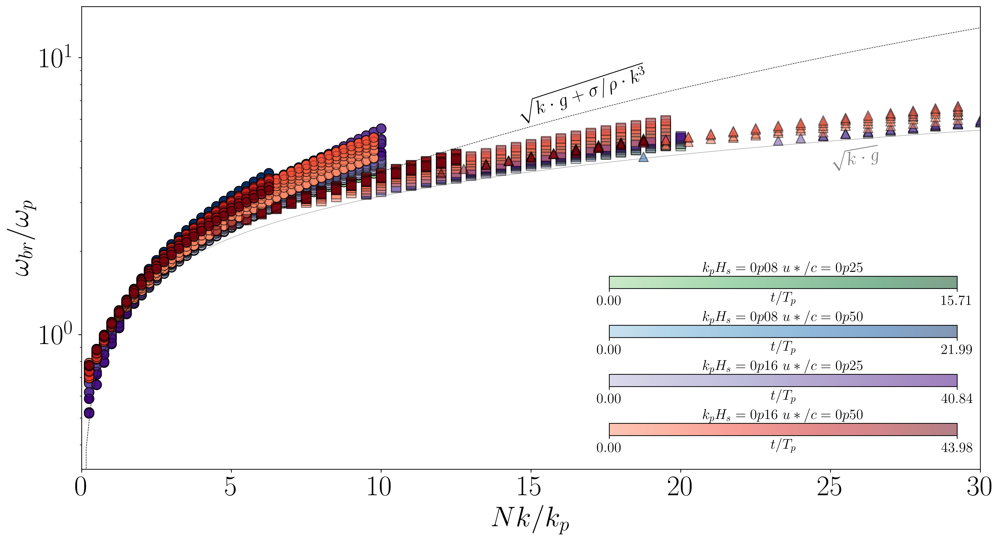

In [14]:
# Define other parameters
from matplotlib.colorbar import Colorbar
symbols = ['o', 's', '^']
labels = ['First', 'Second', 'Third']
# Directory where the CSV files are stored
csv_dir = '/projects/DEIKE/cmartinb/branches_data/'

palettes = {
    r'$k_pH_s =0.08$ $u*/c=0.25$': cmap_08_25,
    r'$k_pH_s =0.16$ $u*/c=0.25$': cmap_16_25,
    r'$k_pH_s =0.16$ $u*/c=0.50$': cmap_16_50,
    r'$k_pH_s =0.08$ $u*/c=0.50$': cmap_08_50
}



# Setup a single plot for all combinations
fig, ax = plt.subplots(figsize=(17, 9))

# Store scatter plots for creating colorbars later
scatter_plots = {}
norms = {}


# Loop over all combinations of kpHs and uoc
for kpHs in kpHs_list:
    for uoc in uoc_list:
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        data = np.loadtxt(work_dir+'eta/global_int.out')

        istep_c =data[:, 1]
        time = data[:,0] 

        # Calculate parameters for each combination
        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)
        # Generate the CSV file path
        print(kpHs,uoc)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)
        
        # Extract the necessary columns from the DataFrame
        k_values_first = df_branches['k_values_first'].to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].to_numpy()
        k_values_second = df_branches['k_values_second'].to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].to_numpy()
        k_values_third = df_branches['k_values_third'].to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].to_numpy()
        normalized_omega_first = df_branches['omega_first'].to_numpy()
        normalized_omega_second = df_branches['omega_second'].to_numpy()
        normalized_omega_third = df_branches['omega_third'].to_numpy()
        

        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)

        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']
        #time_moyens =  df_meanvelocity['time_moyens']
        u_atzero = df_meanvelocity['u_atzero']  
        
        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, len(u_atzero)))
        
        # Initialize interval ranges
        start_idx = 0
        interval_ranges = []
        for i in range(len(u_atzero)):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0
        
        for i in range(len(u_atzero)):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                #print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'sigma is', sigma)                
                #print(f'{time[int(end_idx)] - time[0]}', (time[int(end_idx)] - time[0])/(2*m.pi/omegap), 't/Tp')
                #zkp =  2*np.pi /3/ (k_first*4)
                #uszt1k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                h = 2*np.pi /(m.pi*7)/ (k_first*4)
                
                # Reemplazar caracteres no numéricos y dividir
                ux_avg_i = np.array([float(x) for x in ux_avg[i].replace("\n", "").replace(" ", "").strip("[]").split(",")])
                phi_avg_i = np.array([float(x) for x in phi_avg[i].replace("\n", "").replace(" ", "").strip("[]").split(",")])
                # Realizar la integración para cada valor de k y almacenar los perfiles para la gráfica derecha
                integral_num = []
                for k in k_first:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
                #uszt1k = calcular_integral1( 4*k_first, (time[end_idx] - time[0]) , u_atzero[i], h)
                #ax.scatter(k_first, normalized_omega_first[idx_first] - 2 * np.array(integral_num) * k_first * 4 / omegap, s=100, alpha = 0.5, color=interval_colors[i], edgecolor='black', marker=symbols[0],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                scatter = ax.scatter(
                    k_values_first,
                    normalized_omega_first,
                    c=interval_indices_first,
                    cmap=colormap,
                    s=100,
                    edgecolor='black',
                    alpha=0.5,
                    label=rf'$k_pH_s ={kpHs}$ $u*/c={uoc}$'
                )
                #ax.fill_between(k_first, (normalized_omega_first[idx_first] - uszt1k * k_first * 4/omegap) ,  alpha=0.2, color=interval_colors[i])
            
                # Save scatter plot and normalization for the colorbar
                scatter_plots[(kpHs, uoc)] = scatter
                #norms[(kpHs, uoc)] = norm

            # Plot second branch
            if np.any(idx_second):
                k_second = k_values_second[idx_second]
                #zkp =  2*np.pi /3/ (k_second*4)
                #uszt2k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                
                h = 2*np.pi /(m.pi*7)/ (k_second*4)
                
                integral_num = []
                for k in k_second:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
                #uszt1k = calcular_integral1( 4*k_first, (time[end_idx] - time[0]) , u_atzero[i], h)
                ax.scatter(2*k_second, (normalized_omega_second[idx_second]), s=100, alpha = 0.5, color=interval_colors[i], edgecolor='black', marker=symbols[1],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                #ax.fill_between(k_first, (normalized_omega_first[idx_first] - uszt1k * k_first * 4/omegap) ,  alpha=0.2, color=interval_colors[i])
                
                #uszt2k = calcular_integral1( 4*k_second, (time[end_idx] - time[0]) , u_atzero[i], h)
                #ax.scatter(2 * k_second, normalized_omega_second[idx_second] + uszt2k*(4*k_second)/ omegap, s=100,  alpha = 0.5,color=interval_colors[i], edgecolor='black', marker=symbols[1],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
    
                
            # Plot third branch
            if np.any(idx_third):
                k_third = k_values_third[idx_third]
                #zkp =  2*np.pi /3/ (k_third*4)
                #uszt3k =(u_atzero[i]) *np.exp(- zkp/ (np.sqrt(nu_water*2*(time[int(end_idx)] - time[0]))))
                
                h = 2*np.pi /(m.pi*7)/ (k_third*4)
                
                                # Realizar la integración para cada valor de k y almacenar los perfiles para la gráfica derecha
                integral_num = []
                for k in k_third:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
                #uszt1k = calcular_integral1( 4*k_first, (time[end_idx] - time[0]) , u_atzero[i], h)
                ax.scatter(3*k_third, (normalized_omega_third[idx_third] ), s=100, alpha = 0.5, color=interval_colors[i], edgecolor='black', marker=symbols[2],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                #ax.fill_between(k_first, (normalized_omega_first[idx_first] - uszt1k * k_first * 4/omegap) ,  alpha=0.2, color=interval_colors[i])
                
                #uszt3k = calcular_integral1( 4*k_third, (time[end_idx] - time[0]) , u_atzero[i], h)
                #ax.scatter(3 * k_third, normalized_omega_third[idx_third] + uszt3k *(4*k_third) / omegap, s=100,  alpha = 0.5,color=interval_colors[i], edgecolor='black', marker=symbols[2],label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
            
            
            
            start_idx += (ln - overlap)
            i+=1
            if start_idx >= len(time):
                break
                
                
                

num_intervals=4
handles_kpoHs016_uoc050 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.16$ $u*/c=0.50$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(15)]
handles_kpoHs016_uoc025 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.16$ $u*/c=0.25$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(4)]
handles_kpoHs008_uoc025 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.08$ $u*/c=0.25$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(4)]
handles_kpoHs008_uoc050 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.08$ $u*/c=0.50$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(15)]

        
ax.text(25,4, r'$ \sqrt{k \cdot g} $', c='grey', fontsize = 20, rotation = 10)
ax.text(14.5,6, r'$ \sqrt{k \cdot g + \sigma / \rho \cdot k^3} $', fontsize = 20 ,rotation = 18)              
          

k_diss = np.linspace(0, 120, 200)
dispersion_relation = np.sqrt(k_diss * g)
sigma = (1 - 1.25 * 10**(-3)) / (200 * 4**2)
dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=0.5, c='black')
ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=0.5, c='black')
#ax.set_ylim([0,8])
ax.set_xlim([0,30])
ax.set_yscale('log')
# Labels and legends
ax.set_xlabel(r'$Nk/k_{p}$')
ax.set_ylabel(r'$ \omega_{br} /\omega_{p}$')

import matplotlib.colors as mcolors

colorbar_length = 0.3  
colorbar_pad = 0.08 

def saturate_cmap(cmap, saturation=4):
    """Aumenta la saturación de un colormap."""
    colors_array = cmap(np.linspace(0, 1, 256))
    hsv = mcolors.rgb_to_hsv(colors_array[:, :3])
    hsv[:, 1] = np.clip(hsv[:, 1] * saturation, 0, 1) 
    saturated_colors = mcolors.hsv_to_rgb(hsv)
    return mcolors.LinearSegmentedColormap.from_list("saturated_cmap", saturated_colors)

for idx, ((kpHs, uoc), scatter) in enumerate(scatter_plots.items()):
    vmin, vmax = scatter.norm.vmin, scatter.norm.vmax 

    saturated_cmap = saturate_cmap(scatter.get_cmap(), saturation=1.2)

    cbar_ax = fig.add_axes([
        0.58,
        0.42 - idx * colorbar_pad, 
        colorbar_length, 
        0.02 
    ])

    cbar = Colorbar(
        cbar_ax,
        scatter,
        orientation="horizontal",
        cmap=saturated_cmap, 
        norm=scatter.norm 
    )
    

    cbar.set_ticks([vmin, vmax]) 
    cbar.set_ticklabels([f"{vmin*omegap/2*m.pi:.2f}", f"{vmax*omegap/2*m.pi:.2f}"])  
    
    cbar.ax.tick_params(labelsize=15)
    
    cbar.ax.set_xlabel(
        r"$t/T_{p}$", fontsize=15, labelpad=-18
    )
    cbar.ax.set_title(
        rf'$k_pH_s ={kpHs}$ $u*/c={uoc}$', fontsize=15, pad=5
    )


plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/all_log.png', dpi=300, bbox_inches='tight')
plt.show()



/tmp/ipykernel_907896/3668298311.py:195: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = Colorbar(
/tmp/ipykernel_907896/3668298311.py:195: MatplotlibDeprecationWarning: The 'norm' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = Colorbar(


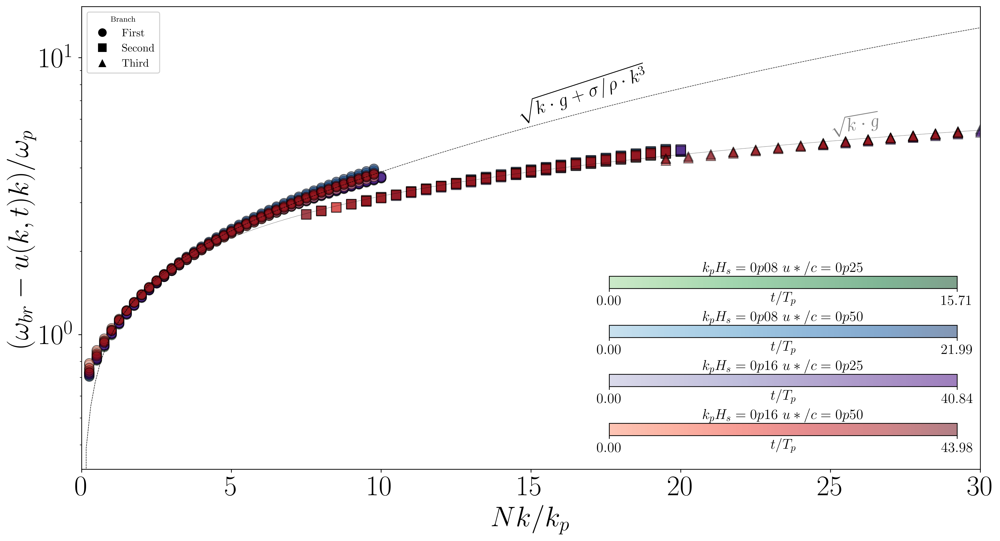

In [15]:
# Define other parameters
symbols = ['o', 's', '^']
labels = ['First', 'Second', 'Third']
# Directory where the CSV files are stored
csv_dir = '/projects/DEIKE/cmartinb/branches_data/'

palettes = {
    r'$k_pH_s =0.08$ $u*/c=0.25$': cmap_08_25,
    r'$k_pH_s =0.16$ $u*/c=0.25$': cmap_16_25,
    r'$k_pH_s =0.16$ $u*/c=0.50$': cmap_16_50,
    r'$k_pH_s =0.08$ $u*/c=0.50$': cmap_08_50
}


fig, ax = plt.subplots(figsize=(17, 9))
for kpHs in kpHs_list:
    for uoc in uoc_list:
        work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
        data = np.loadtxt(work_dir+'eta/global_int.out')

        istep_c =data[:, 1]
        time = data[:,0] 


        ak, c, omegap, nu_water, g, uoc_val = calculate_parameters(kpHs, uoc, u, kp)
        sigma = (g - 1.25 * 10**(-3)) / (Bo * kp**2)

        #print(kpHs,uoc)
        csv_file = os.path.join(csv_dir, f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv')
        
        # Read the DataFrame from the CSV file
        df_branches = pd.read_csv(csv_file)
        
        # Extract the necessary columns from the DataFrame
        k_values_first = df_branches['k_values_first'].to_numpy()
        interval_indices_first = df_branches['interval_indices_first'].to_numpy()
        k_values_second = df_branches['k_values_second'].to_numpy()
        interval_indices_second = df_branches['interval_indices_second'].to_numpy()
        k_values_third = df_branches['k_values_third'].to_numpy()
        interval_indices_third = df_branches['interval_indices_third'].to_numpy()
        normalized_omega_first = df_branches['omega_first'].to_numpy()
        normalized_omega_second = df_branches['omega_second'].to_numpy()
        normalized_omega_third = df_branches['omega_third'].to_numpy()
        
        colormap = colormaps[(kpHs, uoc)]
        interval_colors = colormap(np.linspace(0, 1, 4))
        
        file_path = f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv'

        df_meanvelocity = pd.read_csv(file_path)


        phi_avg = df_meanvelocity['phi_avg']
        ux_avg = df_meanvelocity['ux_avg']

        u_atzero = df_meanvelocity['u_atzero']  

        start_idx = 0
        interval_ranges = []
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
            start_idx += (ln - overlap)
            if start_idx >= len(time):
                break
        
        start_idx = 0
        
        for i in range(4):
            end_idx = start_idx + ln
            if end_idx > len(time):
                end_idx = len(time)
            time_subdivision = time[int(start_idx):int(end_idx)]
            
            idx_first = interval_indices_first == i
            idx_second = interval_indices_second == i
            idx_third = interval_indices_third == i
            
            if np.any(idx_first):
                rho = 1
                sigma = (g - 1.25 * 10**(-3)) / (200*4**2)
                k_first = k_values_first[idx_first]
                h = 2*np.pi /(m.pi*7)/ (k_first*4)
                
                ux_avg_i = np.array([float(x) for x in ux_avg[i].replace("\n", "").replace(" ", "").strip("[]").split(",")])
                phi_avg_i = np.array([float(x) for x in phi_avg[i].replace("\n", "").replace(" ", "").strip("[]").split(",")])
                
                integral_num = []
                for k in k_first:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
                ax.scatter(k_first, normalized_omega_first[idx_first] - 2 * np.array(integral_num) * k_first * 4 / omegap, s=100, alpha = 0.5, color=interval_colors[i],marker=symbols[0], edgecolor='black', label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")

            if np.any(idx_second):
                k_second = k_values_second[idx_second]

                h = 2*np.pi /(m.pi*7)/ (k_second*4)
                
                integral_num = []
                for k in k_second:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
               
                ax.scatter(2*k_second, (normalized_omega_second[idx_second] - 2 * np.array(integral_num) * k_second * 4 / omegap)/1, s=100, alpha = 0.5, color=interval_colors[i],marker=symbols[1], edgecolor='black',label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")

                
            # Plot third branch
            if np.any(idx_third):
                k_third = k_values_third[idx_third]

                h = 2*np.pi /(m.pi*7)/ (k_third*4)
                
                                
                integral_num = []
                for k in k_third:
                    h_val = -1

                    integrand_values = (ux_avg_i) * np.exp(2 * k * 4 * phi_avg_i)
                    doppler_shift_speed = 4 * k * np.trapz(integrand_values, phi_avg_i)
                    integral_num.append(doppler_shift_speed)
        
                ax.scatter(3*k_third, (normalized_omega_third[idx_third] - 2 * np.array(integral_num) * k_third * 4 / omegap)/1, s=100, alpha = 0.5, color=interval_colors[i],marker=symbols[2], edgecolor='black',label=f'{kpHs}, {uoc} - {interval_ranges[i]}' if i == 0 else "")
                
            start_idx += (ln - overlap)
            i+=1
            if start_idx >= len(time):
                break
                
                
num_intervals=4

handles_kpoHs016_uoc050 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.16$ $u*/c=0.50$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(4)]
handles_kpoHs016_uoc025 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.16$ $u*/c=0.25$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(4)]
handles_kpoHs008_uoc025 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.08$ $u*/c=0.25$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(4)]
handles_kpoHs008_uoc050 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palettes[r'$k_pH_s =0.08$ $u*/c=0.50$'](i / (num_intervals - 1)), markersize=10, markeredgecolor='k') for i in range(4)]


# Añadir las leyendas al gráfico
legend_kpoHs016_uoc050 = ax.legend(handles_kpoHs016_uoc050, interval_ranges, loc='lower right',  title=r'$k_pH_s =0.16$ $u*/c=0.50$', title_fontsize = 'x-large', bbox_to_anchor=(1, 0))
#ax.add_artist(legend_kpoHs016_uoc050)

legend_kpoHs016_uoc025 = ax.legend(handles_kpoHs016_uoc025, interval_ranges, loc='lower right', title=r'$k_pH_s =0.16$ $u*/c=0.25$', title_fontsize = 'x-large', bbox_to_anchor=(0.795, 0))
#ax.add_artist(legend_kpoHs016_uoc025)

legend_kpoHs008_uoc050 = ax.legend(handles_kpoHs008_uoc050, interval_ranges, loc='lower right',  title=r'$k_pH_s =0.08$ $u*/c=0.50$', title_fontsize = 'x-large', bbox_to_anchor=(1, 0.22))
#ax.add_artist(legend_kpoHs008_uoc050)

legend_kpoHs008_uoc025 = ax.legend(handles_kpoHs008_uoc025, interval_ranges, loc='lower right', title=r'$k_pH_s =0.08$ $u*/c=0.25$', title_fontsize = 'x-large', bbox_to_anchor=(0.795, 0.22))
#ax.add_artist(legend_kpoHs008_uoc025)
                
ax.text(25,5.3, r'$ \sqrt{k \cdot g} $', c='grey', fontsize = 20, rotation = 10)
ax.text(14.5,6, r'$ \sqrt{k \cdot g + \sigma / \rho \cdot k^3} $', fontsize = 20 ,rotation = 18)               
          
unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(4)]

first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='upper left', title='Branch')
ax.add_artist(first_legend)


colorbar_length = 0.3 
colorbar_pad = 0.08  

def saturate_cmap(cmap, saturation=4):
    """Aumenta la saturación de un colormap."""
    colors_array = cmap(np.linspace(0, 1, 256))
    hsv = mcolors.rgb_to_hsv(colors_array[:, :3])
    hsv[:, 1] = np.clip(hsv[:, 1] * saturation, 0, 1)  
    saturated_colors = mcolors.hsv_to_rgb(hsv)
    return mcolors.LinearSegmentedColormap.from_list("saturated_cmap", saturated_colors)

for idx, ((kpHs, uoc), scatter) in enumerate(scatter_plots.items()):
    vmin, vmax = scatter.norm.vmin, scatter.norm.vmax 


    saturated_cmap = saturate_cmap(scatter.get_cmap(), saturation=1.2)

    cbar_ax = fig.add_axes([
        0.58,  
        0.42 - idx * colorbar_pad,  
        colorbar_length,  
        0.02  
    ])

    cbar = Colorbar(
        cbar_ax,
        scatter,
        orientation="horizontal",
        cmap=saturated_cmap, 
        norm=scatter.norm 
    )
    
    cbar.set_ticks([vmin, vmax]) 
    cbar.set_ticklabels([f"{vmin*omegap/2*m.pi:.2f}", f"{vmax*omegap/2*m.pi:.2f}"])  # Etiquetas simples de extremos
    
    cbar.ax.tick_params(labelsize=15)
    
    cbar.ax.set_xlabel(
        r"$t/T_{p}$", fontsize=15, labelpad=-18
    )
    cbar.ax.set_title(
        rf'$k_pH_s ={kpHs}$ $u*/c={uoc}$', fontsize=15, pad=5
    )



k_diss = np.linspace(0, 120, 200)
dispersion_relation = np.sqrt(k_diss * g)
sigma = (1 - 1.25 * 10**(-3)) / (200 * 4**2)
dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=0.5, c='black')
ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=0.5, c='black')

ax.set_xlim([0,30])

ax.set_xlabel(r'$Nk/k_{p}$')
ax.set_ylabel(r'$ (\omega_{br} - u(k,t)k) /\omega_{p}$')
ax.set_yscale('log')

handles, legend_labels = ax.get_legend_handles_labels()
by_label = dict(zip(legend_labels, handles))

plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/all_minusu_log.png', dpi=300, bbox_inches='tight')
plt.show()

